# Introduction to Statistical Learning

Machine Learning Fundamentals for Economists

Jesse Perla (University of British Columbia)

# Course Overview and Objectives

## Course Overview

-   First half of **ECON 622: Computational Economics with Data Science
    Applications**
-   This section will cover a light version of important theory and
    methods from machine learning
-   While we will cover applications, the emphasis will be on providing
    mathematical/statistical foundations to
    -   Understand these methods, and know their promises and
        limitations
    -   Adapt methods used in other disciplines to economic problems

## Textbooks

-   All content in lecture notes, but some useful references from Kevin
    Murphy:
    -   @probml1 [Probabilistic Machine Learning: An
        Introduction](https://probml.github.io/pml-book/book1.html)
    -   @probml2 [Probabilistic Machine Learning: Advanced
        Topics](https://probml.github.io/pml-book/book2.html)
-   See online PDFs and code at <https://github.com/probml/pyprobml>
-   Also see @dive2023
    -   Provides more applied introduction with code examples in Python

## Key Concepts and Topics

-   Statistical Learning
    -   Supervised, unsupervised, self-supervised, generative
    -   Regularization and inductive bias
-   Representation Learning (and Deep Learning)
    -   Feature learning vs. hand-crafted features
    -   Embeddings, geometry, and dimensionality reduction
    -   Transfer learning and reuse of representations
-   High-Dimensional Optimization
    -   High-dimensional probability and concentration of measure
    -   Iterative and stochastic optimization methods
    -   Differentiation, forward- and reverse-mode autodiff
-   Bayesian Methods and Uncertainty Quantification

# Teaser on Generative AI

## Google AI Studio and Gemini API

1.  Sign up at [aistudio.google.com](https://aistudio.google.com/)
    -   There is a free tier with reasonable usage limits
    -   Later we will look at OpenAI and others
2.  Choose to *“Get API key”* in the sidebar (see
    [here](https://ai.google.dev/gemini-api/docs/api-key) for details)
3.  Set `GEMINI_API_KEY` as an [environment
    variable](https://ai.google.dev/gemini-api/docs/api-key#set-api-env-var)

## Python Packages

We will showcase a few examples using the Gemini API.

In [1]:
from google import genai
from google.genai import types
from IPython.display import display
from IPython.display import Image as IPImage

## Calling an API

In [2]:
model = "gemini-2.0-flash"  # or another model
client = genai.Client()

response = client.models.generate_content(
    model=model,
    contents="Describe the concept of generative AI in one sentence."
)

print(response.text)

Generative AI creates new, original content like text, images, audio, or code by learning patterns from existing data.


## Take 2: Context/Conditioning

In [3]:
response = client.models.generate_content(
    model=model,
    contents="""
  You are an expert econometrician. Describe the concept of generative AI in one sentence.
    """
)
print(response.text)

Generative AI refers to a class of artificial intelligence models that can generate new, realistic data instances mimicking the distribution of their training data, allowing for tasks like synthetic data creation, image generation, and text completion.


## System Instructions (Persona)

In Gemini, “System Context” is a specific parameter in the
configuration, ensuring the model adheres to the persona throughout the
generation.

In [4]:
config = types.GenerateContentConfig(
    system_instruction="You are a helpful econometrician who speaks in clear, academic prose."
)
response = client.models.generate_content(
    model=model,
    config=config,
    contents="Describe the concept of generative AI in one sentence."
)
print(response.text)

Generative AI refers to a class of artificial intelligence models capable of producing new, original content, such as text, images, audio, or other data, by learning the underlying patterns and structures from existing data.


-   For multi-step conversations, see [<span class="button">Chat
    Example</span>](#sec-chat-example)

## Sampling Images

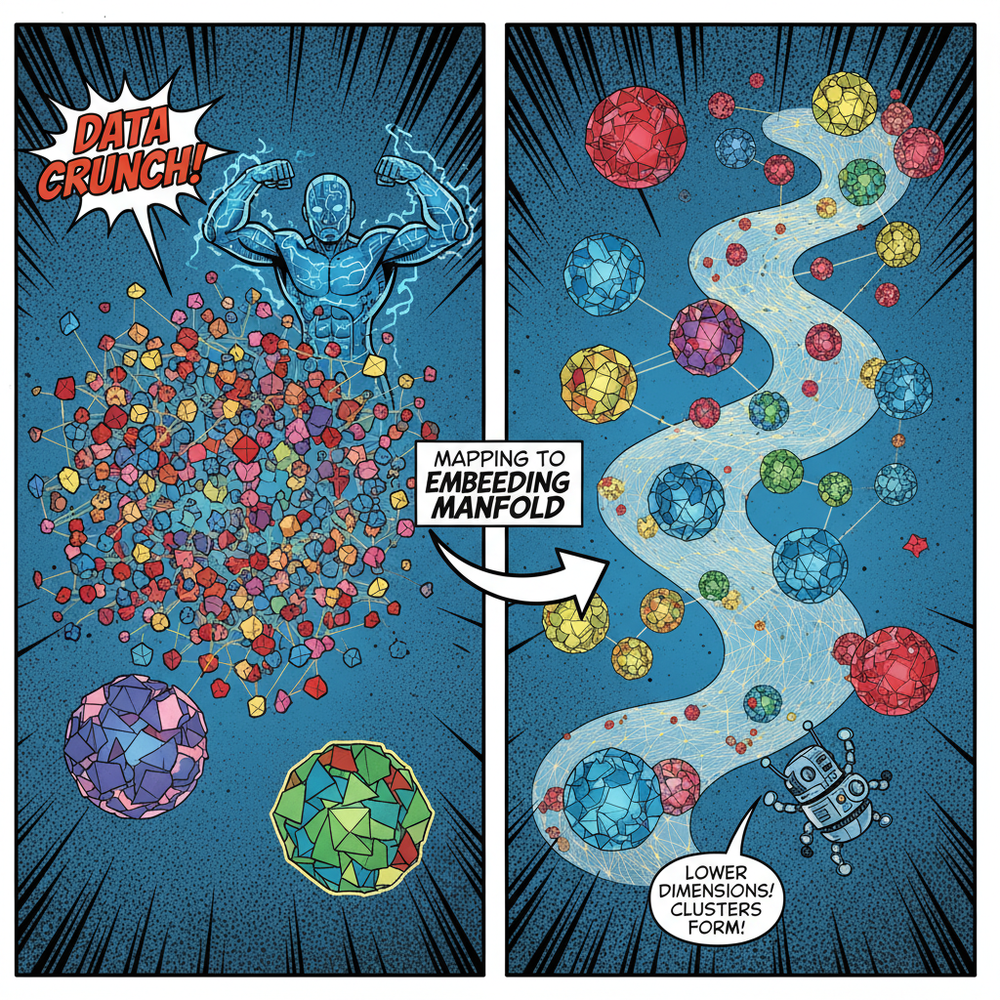

In [5]:
prompt = """
A comic-book stylized visualization
of mapping to an embedding manifold, showing data
points clustering in lower dimensions."""

response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"]
    )
)
generated_img = response.parts[0].as_image()
display(IPImage(data=generated_img.image_bytes,
format='png'))

## How is this Possible?

-   The dimensionality of everything is enormous
-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    Learn how to use these methods for traditional tasks
    -   e.g., classification and digitization as in @dell2025deep
-   Is there any benefit for using related methods for solving more
    traditional economic problems?
    -   “Solving” functional equations with equilibrium conditions
    -   Estimating structural models
    -   Heterogeneous agent models
    -   causal inference (in second half of course)
-   What is it actually doing, and how can we interpret it?

# Statistical Learning and Functional Equations

## Population Distribution

-   Statistical learning studies functions of random variables defined
    on an underlying probability space

-   Observed data are realizations from an unknown *population
    (data-generating) distribution*

    $$
    \newcommand{\ensuremath}[1]{#1}
    \newcommand{\R}{\mathbb{R}}
    \newcommand{\E}{\mathbb{E}}
    \newcommand{\N}{\mathbb{N}}
    \newcommand{\argmax}{\operatorname{argmax}}
    \newcommand{\argmin}{\operatorname{argmin}}
    \newcommand{\expec}[2][]{{\mathbb{E}_{{#1}}\left[ {#2} \right]}}
    \newcommand{\Xdom}{{\mathcal{X}}}
    \newcommand{\Ydom}{{\mathcal{Y}}}
    \newcommand{\Frange}{{\mathcal{Z}}}
    \newcommand{\Fdom}{{\mathcal{F}}}
    \newcommand{\Xtrain}{{\mathcal{D}}}
    \newcommand{\Xtest}{{\mathcal{D}_{\mathrm{test}}}}
    \newcommand{\HC}{{\mathcal{H}}}
    \newcommand{\fpop}{{f^*}}
    \newcommand{\thetaerm}{{\theta^*}}
    \newcommand{\ferm}{{f_{\thetaerm}}}
    \newcommand{\iidsim}{\overset{\mathrm{iid}}{\sim}}
    \newcommand{\popdist}{\mu^*}
    \newcommand{\prob}[2][]{{\mathbb{P}_{#1}\left( {#2} \right)}}
    \newcommand{\cprob}[2]{{\mathbb{P}\left( {#1}\left| {#2} \right. \right)}}
    \newcommand{\apperror}{\ensuremath{\varepsilon_{\mathrm{app}}}}
    \newcommand{\generror}{\ensuremath{\varepsilon_{\mathrm{gen}}}}
    \newcommand{\relerror}{\ensuremath{\varepsilon_{\mathrm{rel}}}}
    (X, Y) \sim \popdist
    $$

    -   $X \in \Xdom$: inputs / features / covariates / states
    -   $Y \in \Ydom$: targets / labels / dependent variables
    -   Typically $\popdist$ is unknown and only observed through
        samples
    -   For now, assume $\popdist$ is fixed (not innocuous, especially
        in econ applications)

-   In supervised learning, one object of interest is the conditional
    distribution $Y \mid X$

    -   If solving a functional equation, $Y$ may be absent and we
        consider $X \sim \popdist$

## Risk Minimization

-   Many problems in ML, econometrics, and numerical analysis can be
    framed as finding an object $f \in \Fdom$ (e.g., a function, policy,
    or operator) such that $$
    \fpop
    = \arg\min_{f \in \Fdom}
    \underbrace{\mathbb{E}_{(X,Y)\sim \popdist}
    \left[\ell(X, Y, f)\right]}_{\equiv R(f, \popdist)}.
    $$

-   One canonical example evaluates the squared error loss of
    “prediction” $$
    \fpop
    = \arg\min_{f \in \Fdom}
    \mathbb{E}_{(X,Y)\sim \popdist}
    \left[\|Y - f(X)\|_2^2\right].
    $$

    -   This corresponds to modeling the conditional mean of $Y \mid X$

## Likelihoods and Population MLE

-   More generally, $f$ may parameterize a full conditional distribution
    of $Y$ given $X$ $$
    \fpop
    = \arg\min_{f \in \Fdom}
    \mathbb{E}_{(X,Y)\sim \popdist}
    \left[-\log \mathbb{P}_f(Y \mid X)\right].
    $$

    -   This is population MLE for the conditional model
        $\mathbb{P}_f(\cdot \mid X)$
    -   Squared-error regression corresponds to a Gaussian likelihood
        with fixed variance
    -   Discrete-choice/classification corresponds to discrete
        conditional distributions

-   Equivalently, minimizes the expected KL divergence (see
    [<span class="button">KL Divergence</span>](#sec-kl-divergence)) $$
    \mathbb{E}_{X\sim\popdist}
    \mathrm{KL}\!\left(\popdist(Y\mid X)\,\|\,\mathbb{P}_f(Y\mid X)\right),
    $$

## Functional Equations

-   In many economic and numerical problems there is no target variable
    $Y$

-   Instead, the goal is to find an object $f \in \Fdom$ satisfying
    conditions indexed by a state $X$ $$
    \fpop
    = \arg\min_{f \in \Fdom}
    \mathbb{E}_{X\sim \popdist}
    \left[\ell(f, X)\right].
    $$

    -   The loss measures violations of a functional equation at state
        $X$

-   If $\ell(X, \fpop) = 0$ for all $X \in \Xdom$, then $\fpop$ solves
    the functional equation pointwise

-   Risk minimization relaxes exact solution to an approximate solution
    in expectation

## Learning the $\fpop$ or $\popdist(Y \mid X)$

-   Outside of special cases, you cannot evaluate the objective
    directly.
-   Several challenges:
    1.  The population distribution $\popdist$ is unknown
    2.  The function class $\Fdom$ may be too rich to optimize over
        directly
    3.  There may be (massive) multiplicity of functions which fulfill
        the objective
-   In practice, we need to
    1.  Use
        $\Xtrain \equiv \{((X_1, Y_1), \ldots, (X_M, Y_M))\}\subset \Xdom \times \Ydom$
    2.  Restrict to a smaller “hypothesis class”
        $\HC(\Theta) \subseteq \Fdom$ with elements
        $f_\theta\in \HC(\Theta)$
    3.  Regularize directly or indirectly to choose among $f_\theta$

## Empirical Risk Minimization (ERM)

-   Frequently, we will assume IID draws, $\Xtrain \iidsim \popdist$,
    but this can be relaxed

-   Then the empirical counterpart to “risk minimization” (ERM) is

    $$
    \thetaerm \equiv \arg\min_{\theta \in \Theta}\underbrace{\frac{1}{|\Xtrain|}\sum_{(X,Y) \in \Xtrain} \ell(f_{\theta}, X, Y)}_{\equiv \hat{R}(\theta,\Xtrain)}
    $$

    -   Variations will include “regularization”, auxilarly objectives,
        tricks to handle constraints
    -   More advanced methods will also consider the sampling process
        for $\Xtrain$
    -   <span class="bg"
        style="--col: #107895; color: white">TOPIC</span> Especially
        challenging is when $\popdist(\cdot\,|\,\fpop)$, i.e., the
        distribution of future states in a macro model depends on the
        underlying policy

## Example: Maximum Likelihood Estimation

-   The MLE case uses the negative log-likelihood loss
    $\ell(f_\theta, X, Y) = -\log \mathbb{P}_{f_\theta}(Y \mid X)$

-   The ERM objective becomes

    $$
    \thetaerm = \arg\min_{\theta \in \Theta} \frac{1}{|\Xtrain|}\sum_{(X,Y) \in \Xtrain} \left[-\log \mathbb{P}_{f_\theta}(Y \mid X)\right]
    $$

## Special Cases

-   **Regression**:
    $Y \mid X \sim \mathcal{N}(f_\theta(X), \sigma^2) \Rightarrow$ least
    squares
-   **Classification**: $Y \in \{1, \ldots, K\}$ with softmax (i.e.,
    multinomial logit, see @dive2023 \[section 4.1\])
    -   Model outputs $f_\theta(X) \in \R^K$, then apply softmax/logit:

    $$
    \mathbb{P}_{f_\theta}(Y = k \mid X) \equiv \mathrm{softmax}(f_\theta(X))_k \equiv \frac{\exp(f_\theta(X)_k)}{\sum_{j=1}^K \exp(f_\theta(X)_j)}
    $$

-   Cross-entropy loss is $-\log \mathrm{softmax}(f_\theta(X))_Y$
    (negative log-probability of true class $Y$)

## High-Dimensional Optimization

-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    How can we optimize this in practice for
    -   high dimensional $\Xdom$
    -   large $|\Xtrain|$
    -   high-dimensional $\theta$
    -   complicated $\ell(\cdot)$ and $f_{\theta}$
    -   e.g., stochastic optimization and iterative methods
-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    How can we get gradients for optimization methods?
    -   e.g., $\nabla_{\theta} \ell(f_{\theta}, X, Y)$
    -   Automatic differentiation (autodiff)

## Clarity on our Goal

-   The optimization problem is a means-to-and-end:

    -   Want an $f_{\thetaerm}$ such that $R(f_{\thetaerm}, \popdist)$
        is as close to $R(\fpop, \popdist)$ as possible
    -   Solving ERM accurately is neither necessary nor sufficient for
        this purpose

-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    How well does a $f_{\thetaerm}$ approximate the population risk
    minimizer?

-   Crucially, this is **not** the same goal as minimizing the uniform
    error $$
    \arg\min_{f \in \Fdom}
    \max_{(X,Y)\in \Xdom\times\Ydom}
    \left[\ell(X, Y, f)\right].
    $$

    -   For low dimensional $(X,Y)$ this may be possible, but…

## Error Decomposition

-   Two separate sources of approximation error here (the bias-variance
    tradeoff):
    1.  **Approximation error $\apperror$** (i.e. bias):
        $f_{\thetaerm} \in \HC(\Theta)$ may not be able to represent
        $\fpop$
    2.  **Generalization error $\generror$** (i.e. variance): Finite
        sample size of $\Xtrain \iidsim \popdist$
-   Abuse notation and decompose following @bottou2007tradeoffs,
    @probml1 $$
    \small
    \mathbb{E}_{\Xtrain \iidsim \popdist}\left[\min_{\theta \in \Theta} \hat{R}(\theta, \Xtrain) - \min_{f \in \mathcal{F}} R(f, \popdist)\right] = \underbrace{ R(\ferm, \popdist) - R(\fpop, \popdist)}_{\equiv \apperror(\ferm)} + \underbrace{\mathbb{E}_{\Xtrain \iidsim \popdist}\left[\hat{R}(\theta^*, \Xtrain) - R(\ferm, \popdist)\right]}_{\equiv \generror(\ferm)}
    $$
    -   <span class="bg"
        style="--col: #107895; color: white">TOPIC</span> Modern ML
        shows we can often reduce both (e.g., will cover later when
        discussing double-descent literature)
    -   With a very flexible $\HC(\Theta)$ such as neural networks often
        $\apperror(\ferm) \approx 0$
    -   Then error is
        $\generror(\ferm) \approx \hat{R}(\theta^*, \Xtrain) - \hat{R}(\theta^*, \Xtest)$
        given new samples $\Xtest \iidsim \popdist$

-   **Caution!** When we apply problem structure it will be less clear
    that $\apperror$ is small.
-   **More Caution!** If you sample $\Xtrain$ and $\Xtest$ from
    different distributions, all bets are off.

## Dimensionality with LLMs

-   Consider the scale of generalization in modern deep learning
-   Generative Pretrained Transformers (GPTs) approximate the
    conditional distribution of the next token

$$
\mathbb{P}\left[X_{T+1}\,|\,X_T, \ldots, X_1\right]
$$

-   Given a sequence $X_1, \ldots, X_T$ of discrete random variables
    (tokens)
-   Fit with variations on MLE over massive text corpora

## LLM Scale

-   Frontier LLMs circa 2025: vocabulary of $K \approx 100{,}000$
    tokens, context windows of $T \approx 1{-}2$ million
-   GPT-4 class models: $|\Theta| \approx 1{-}2$ trillion parameters
    approximating

$$
\mathbb{P} : \{1, \ldots, K\}^{T+1} \to [0,1], \quad K^{T+1} \approx (10^5)^{10^6} = 10^{5 \times 10^6}
$$

-   Trained on $\approx 10{-}15$ trillion tokens of text data
-   A tiny amount of data relative to the size of the function being
    approximated
-   Paraphrasing @belkin2023copernicus: like reconstructing an entire
    library from a molecule of ink

## LLM Architecture as Representation Learning

-   The model factorizes through a latent representation $\phi(\cdot)$
    (Transformer) and softmax $g(\cdot)$

$$
\phi : \{1, \ldots, K\}^T \to \R^L, \quad g(z) = \mathrm{softmax}(W z) \in \Delta_K
$$

-   $\Delta_K \equiv \{p \in \R^{K}_+ : \sum_{k=1}^K p_k = 1\}$ is the
    $K$-simplex (probability distributions over $K$ tokens)
-   $\phi$ encodes the context $(X_1, \ldots, X_T)$ into a latent vector
    $z \in \R^L$
-   $g$ maps the latent to a probability distribution over the next
    token via learned weights $W \in \R^{K \times L}$
-   Once learned, $\phi(\cdot)$ is useful for downstream tasks:
    embeddings, imputation, classification, etc.

Can also use representation for imputation
$\mathbb{P}\left[X_t\,|\,X_1,\ldots, X_{t-1}, X_{t+1}, \ldots, X_T\right]$
and other tasks.

# Representations

## Transformations of the Input

-   Could approximate a function $f(X)$ with a “shallow” approximation,
    e.g. polynomials of $X$. Alternatively, nest functions $h(\cdot)$
    and $\phi(\cdot)$ $$
    f(X) \approx h(\phi(X))
    $$
    -   First, the $\phi(X)$ will transform the state into something
        more amenable for the downstream task (e.g. prediction,
        classification, etc.)
    -   Then the $h(\cdot)$ maps that transformed state into the output.
-   Could engineer the transformation $\phi(\cdot)$ by hand (e.g., take
    means, logs, first-differences). Called “Feature engineering”

## Example: Polynomial Basis

-   Suppose $X \in \R$ and we want to approximate $f(X)$ with a
    polynomial of degree $d$

-   For some polynomial basis $T_1(X), \ldots, T_d(X)$ (e.g., monomials,
    Chebyshev, Legendre, etc.) $$
    \phi(X) = \begin{bmatrix}1 & T_1(X) & T_2(X) & \cdots & T_d(X)\end{bmatrix}^{\top}
    $$

    -   Note that there are no “learned” parameters!

-   And then approximate $f_{\theta}(X)$ as a linear function,
    $h(z) = \theta^{\top} z$, of those basis functions $$
    f_{\theta}(X) \equiv \theta^{\top} \phi(X) = \sum_{i=0}^d \theta_i T_i(X)
    $$

## Learning Representations

-   Instead of hand-crafting $\phi(\cdot)$, we can **learn** it from
    data
-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    This process is called **representation learning**
-   Good representations:
    -   Capture essential characteristics of the data
    -   Discard irrelevant information (compression/denoising)
    -   Orthogonalize sources of variation (disentanglement)
-   Once learned, $\phi(\cdot)$ is often reusable for multiple
    downstream tasks

## Depth and Representation Learning

-   The mapping to outputs $h(\cdot)$ is often “shallow” (e.g., linear
    or low-order polynomial)

-   In contrast, the transformation $\phi(\cdot)$ into representation
    space is usually “deep”

    $$
    \phi \equiv \phi_L \circ \cdots \circ \phi_1
    $$

-   As data becomes richer, unstructured, and higher-dimensional,
    transformations become harder to design manually

-   <span class="bg" style="--col: #107895; color: white">TOPIC</span>
    Neural networks compose simple nonlinear functions to learn
    complicated transformations

    -   Depth leads to a combinatorial explosion in representational
        capacity

## Representation Learning (Visual)

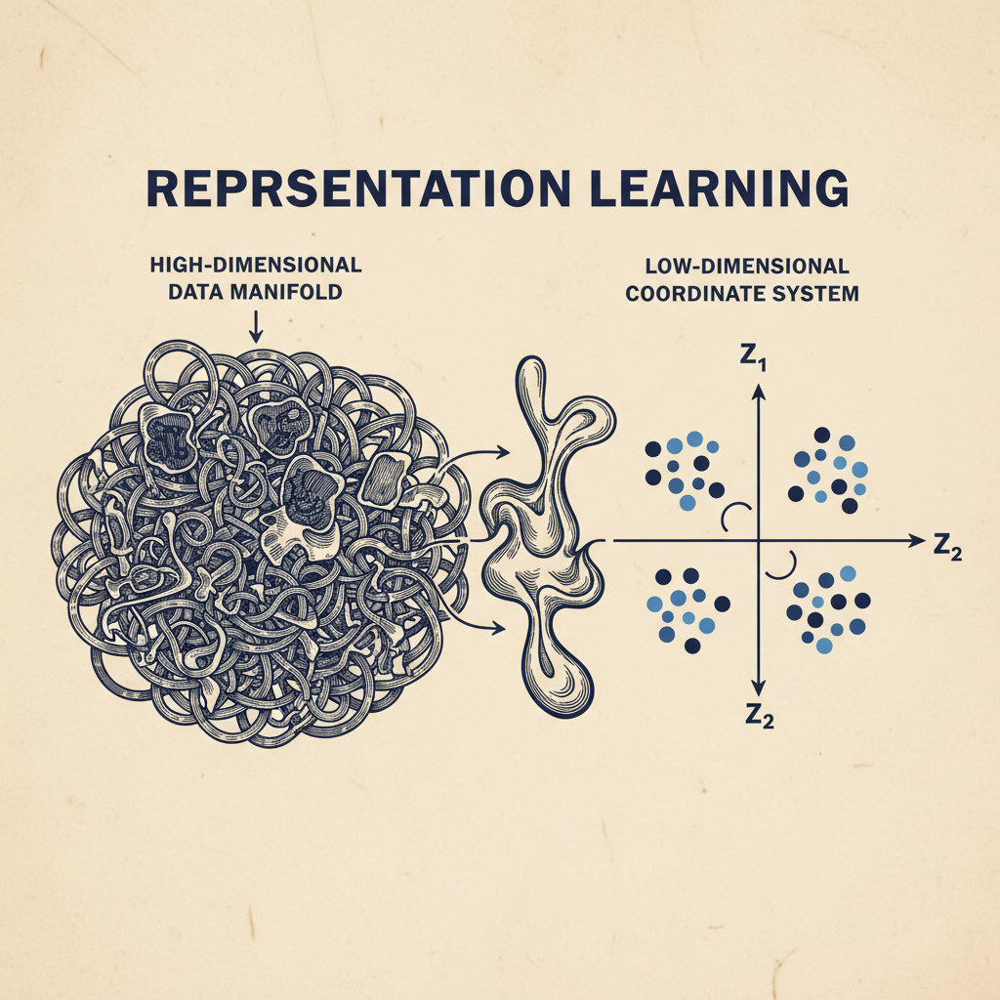

In [6]:
prompt = """
A stylized illustration of representation learning as a
smooth change of variables: a tangled, high-dimensional
data manifold being unfolded into a flat, low-dimensional
coordinate system. The left side shows intertwined curves
and knots; the right side shows clean, orthogonal axes
with separated clusters. Etching / wood-cut / scientific
engraving style, high contrast, minimal color palette."""
response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"]
    )
)
generated_img = response.parts[0].as_image()
display(IPImage(data=generated_img.image_bytes,
format='png'))

## Representation Learning 2

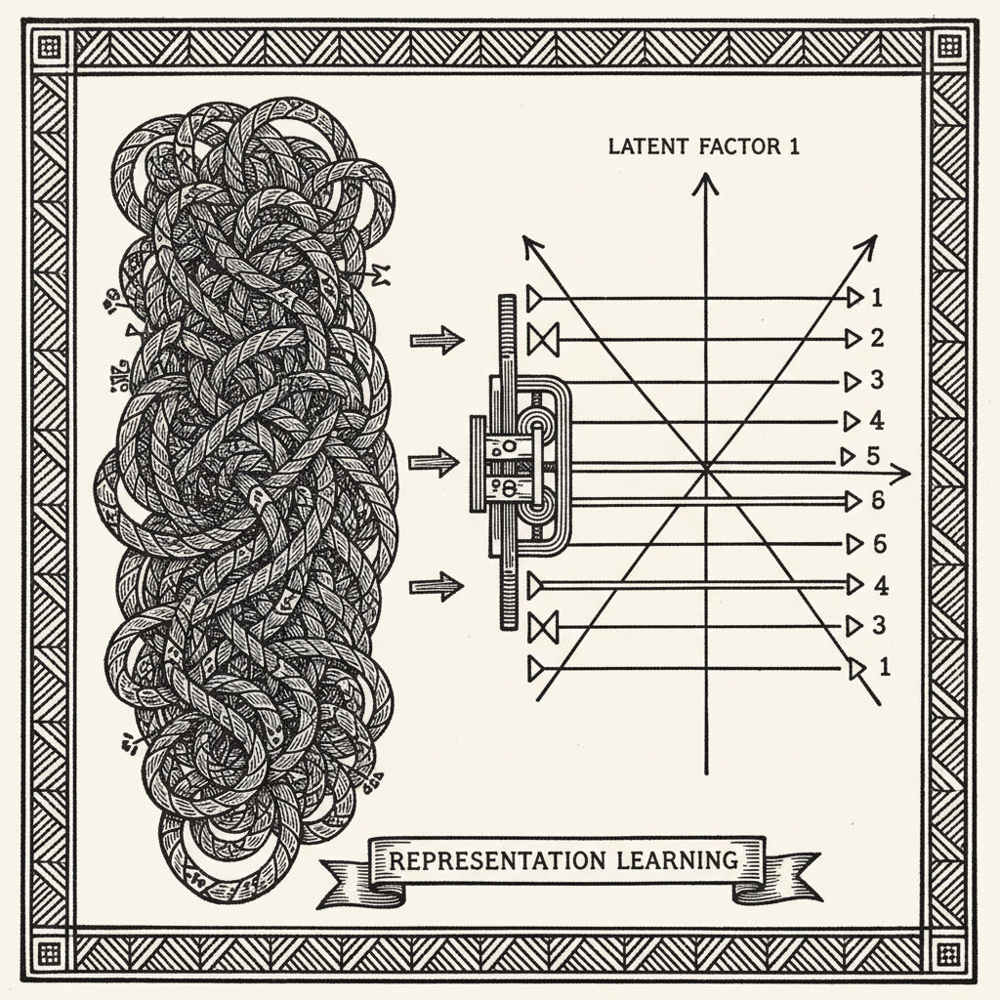

In [7]:
prompt = """
An artistic visualization of representation learning
where entangled threads of data are transformed into
independent latent factors. On the left, a dense braid
of overlapping fibers; on the right, parallel strands
aligned along clear axes. Emphasize symmetry, order,
and factorization. Rendered in a vintage wood-engraving
or linocut style."""
response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"]
    )
)
generated_img = response.parts[0].as_image()
display(IPImage(data=generated_img.image_bytes,
format='png'))

## Representation Learning 3

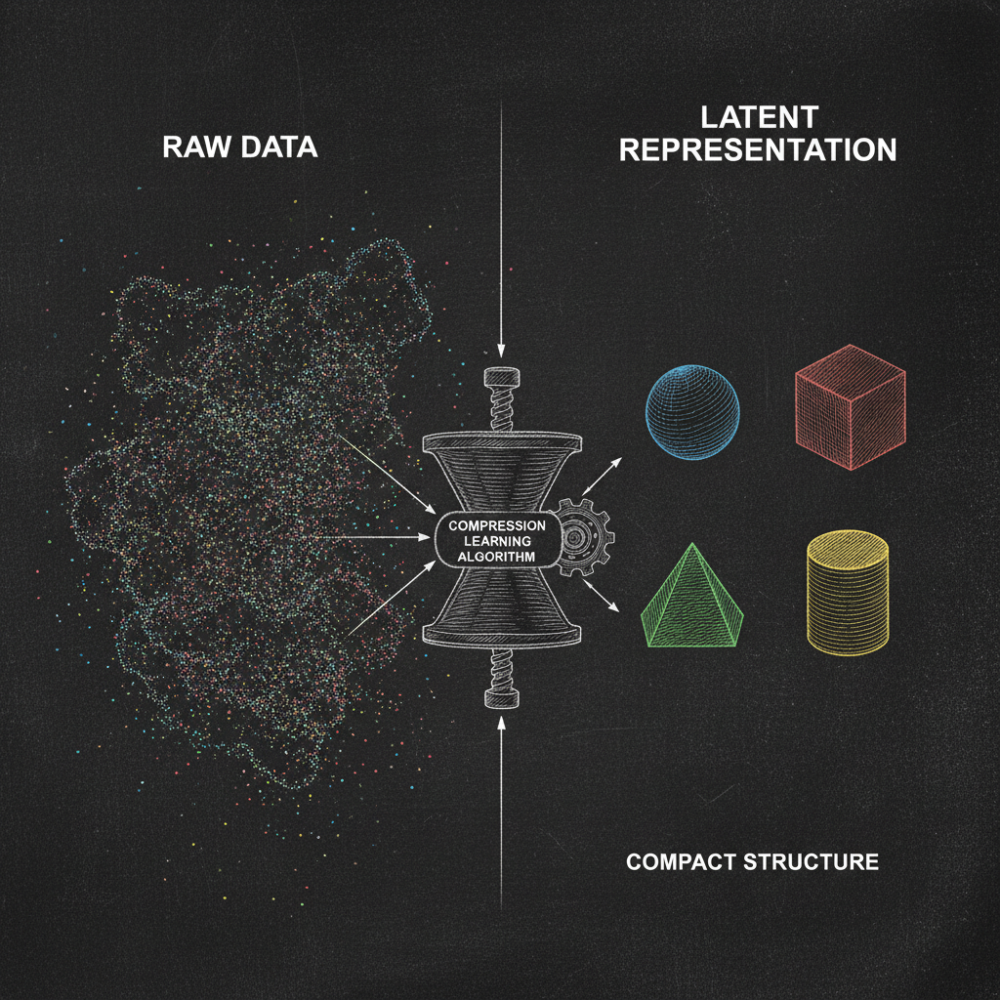

In [8]:
prompt = """
A visual metaphor for representation learning as
 information compression: raw, noisy data clouds
 are compressed through a narrow bottleneck into
 a compact latent space that preserves structure.
 Before-and-after panels. Use engraved, chalkboard,
 or woodcut academic illustration style."""
response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"]
    )
)
generated_img = response.parts[0].as_image()
display(IPImage(data=generated_img.image_bytes,
format='png'))

## Representation Learning 4

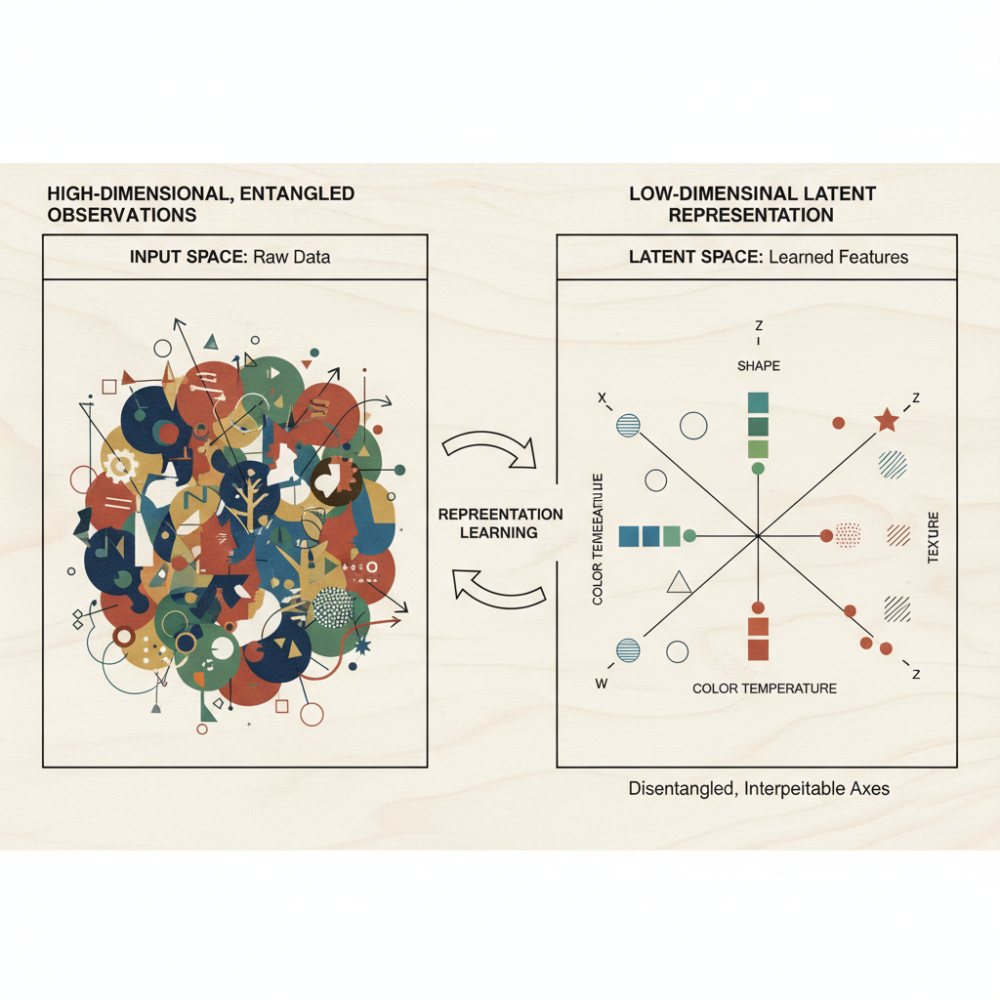

In [9]:
prompt = """
A two-panel educational illustration explaining
representation learning. Left panel: high-dimensional,
entangled observations with overlapping features. Right
panel: low-dimensional latent representation with
disentangled, interpretable axes. Clean academic diagram
style with subtle wood-engraving texture."""
response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"]
    )
)
generated_img = response.parts[0].as_image()
display(IPImage(data=generated_img.image_bytes,
format='png'))

# Computational Environment

## Programming Languages

-   Python
    -   “Raw” Numpy/skit-learn/etc.
    -   Torch, JAX, etc.
-   Julia
-   In this half we will focus on Python, but Julia has advantages in
    other areas.

## Summary of Python Installation

See [here](../pages/python_setup.qmd) for more details.

1.  Install [git](https://git-scm.com/downloads)
2.  Install [VS Code](https://code.visualstudio.com/)
3.  Install [uv](https://github.com/astral-sh/uv) from terminal:
    -   MacOS or Linux:
        `curl -sSfL https://raw.githubusercontent.com/astral-sh/uv/main/install.sh | sh`
    -   Windows:
        `powershell -c "irm https://astral.sh/uv/install.ps1 | more"`
        from powershell terminal

## Clone Notebooks and Install Packages

1.  Open the command palette with `<Ctrl+Shift+P>` or `<Cmd+Shift+P>` on
    mac and type `> Git: Clone` and choose
    `https://github.com/jlperla/grad_econ_ML_notebooks`
2.  In VS Code terminal in that repo, `uv sync`
3.  Then use VS Code to open any of the notebooks in that folder

## Summary of Julia Installation

See [here](../pages/julia_setup.qmd) for more details.

1.  Install [Git](https://git-scm.com/install/)
2.  Install [VS Code](https://code.visualstudio.com/)
3.  Install Julia following the [Juliaup
    instructions](https://github.com/JuliaLang/juliaup#installation)
    -   Windows: `winget install julia -s msstore` in a terminal
    -   Linux/Mac: `curl -fsSL https://install.julialang.org | sh` in a
        terminal
4.  Install the [VS Code Julia
    extension](https://marketplace.visualstudio.com/items?itemName=julialang.language-julia)

## Clone Notebooks and Install Packages

1.  Open the command palette with `<Ctrl+Shift+P>` or `<Cmd+Shift+P>` on
    mac and type `> Git: Clone` and choose
    `https://github.com/jlperla/grad_econ_ML_notebooks`

2.  Instantiate packages by running VS Code terminal

    -   `] instantiate`, where `]` enters package mode

3.  Then use VS Code to open any of the notebooks in that folder

Note: the same clone’d repo can work for both Julia and Python

# Appendices

## Multi-step Conversations (Chat) [<span class="button">Back</span>](#sec-system-instructions)

Use `client.chats.create()` to manage state. The `chat` object
automatically tracks history so you don’t have to pass it back manually.

In [10]:
chat = client.chats.create(model=model, config=config)
res1 = chat.send_message("Describe the concept of generative AI in one sentence.")
print(f"Step 1: {res1.text}\n")

# Contextual follow-up
res2 = chat.send_message("Explain in one sentence how that relates to sampling from probability distributions.")
print(f"Step 2: {res2.text}")

Step 1: Generative artificial intelligence encompasses a class of machine learning models capable of producing novel, realistic data instances that resemble a given training dataset, thereby generating new content rather than simply classifying or predicting from existing data.


Step 2: Generative AI models learn the underlying probability distribution of the training data and effectively sample from this learned distribution to create new data points that are statistically similar to the original data.


## Population MLE and KL Divergence [<span class="button">Back</span>](#sec-MLE)

-   Let $\popdist(Y \mid X)$ denote the true conditional distribution,
    and $\mathbb{P}_f(Y \mid X)$ the model-implied conditional
    distribution

-   Take the the expected negative log-likelihood, condition on $X$ and
    use the LIE $$
    \begin{aligned}
    \mathbb{E}_{(X,Y)\sim\popdist}
    \left[-\log \mathbb{P}_f(Y \mid X)\right]
    &=
    \mathbb{E}_{X\sim\popdist}
    \left[
      \mathbb{E}_{Y\sim\popdist(\cdot\mid X)}
      \left[-\log \mathbb{P}_f(Y \mid X)\right]
    \right].
    \end{aligned}
    $$

-   Add and subtract $\log \popdist(Y \mid X)$ inside the inner
    expectation $$
    \begin{aligned}
    &=
    \mathbb{E}_{X\sim\popdist}
    \Big[
      \underbrace{
      \mathbb{E}_{Y\sim\popdist(\cdot\mid X)}
      \left[
        \log \frac{\popdist(Y \mid X)}{\mathbb{P}_f(Y \mid X)}
      \right]
      }_{\mathrm{KL}(\popdist(Y\mid X)\,\|\,\mathbb{P}_f(Y\mid X))}
      &
      + \underbrace{
      \mathbb{E}_{Y\sim\popdist(\cdot\mid X)}
      \left[-\log \popdist(Y \mid X)\right]
      }_{\text{does not depend on } f}
    \Big].
    \end{aligned}
    $$

-   Therefore, minimizing expected log-loss is equivalent to minimizing
    KL $$
    \mathbb{E}_{(X,Y)\sim\popdist}
    \left[-\log \mathbb{P}_f(Y \mid X)\right]
    =
    \mathbb{E}_{X\sim\popdist}
    \left[
      \mathrm{KL}\!\left(
        \popdist(Y\mid X)\,\|\,\mathbb{P}_f(Y\mid X)
      \right)
    \right]
    + \text{constant}.
    $$

    ## References